<a href="https://colab.research.google.com/github/LorenzoCatalan1/ProblemStats24/blob/main/Lorenzo_catalan_Final_Project_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Final Project Notebook - Spring 2024

In [ ]:
import matplotlib.pyplot as plt  # Importing matplotlib for plotting
import imageio  # Importing imageio to read images from URLs
import torch  # Importing PyTorch
import torchvision  # Importing torchvision for pre-trained models and transforms
from torchvision import models, transforms  # Importing specific modules from torchvision
import numpy as np  # Importing NumPy for numerical operations
from PIL import Image  # Importing PIL for image processing
import requests  # Importing requests to handle HTTP requests
from torchsummary import summary  # Importing summary from torchsummary to summarize models

In [ ]:
def plot(x):
    fig, ax = plt.subplots() #create a matplotlib figure and axis
    im = ax.imshow(x,cmap='gray') #dispaying the image with a grayscale colormap
    ax.axis('off') #turn off the axis
    fig.set_size_inches(20, 20) #setting the figure size
    plt.show()

In [ ]:
im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')
#reading the image from the url

<ipython-input-3-2086ec9e0cf6>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')


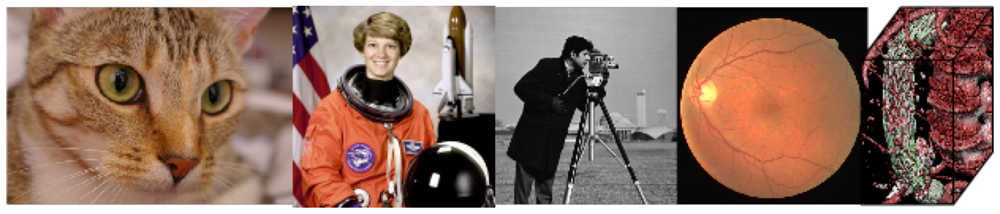

In [ ]:
plot(im) #plotting the image from the url

Loading a pre-trained AlexNet model and preprocessing the image

In [ ]:
net = alexnet(pretrained=True).cuda(0) #Loading the AlexNet model and moving it to the GPU

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:05<00:00, 44.1MB/s]


In [ ]:
normalize = transforms.Normalize( #defining the normalization parameters
   mean=[0.485, 0.456, 0.406], #mean values for each parameter
   std=[0.229, 0.224, 0.225] #standard deviations for each channel
)
preprocess = transforms.Compose([ #creating a sequence of transformation
   transforms.Resize(256), #resizing the image
   transforms.CenterCrop(224), #center cropping the image
   transforms.ToTensor(), #normalizing the tensor
   normalize
])

In [ ]:
im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')
#reading another image from another url

<ipython-input-7-772805ffc2cf>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')


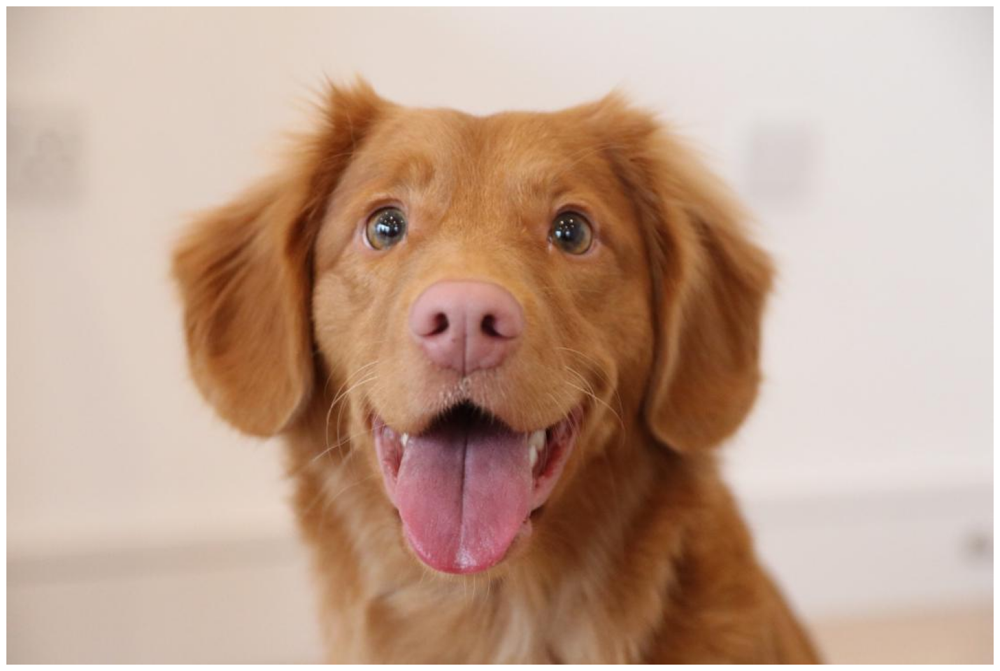

In [ ]:
plot(im) #plotting the image from the new url

Converting the image to a PyTorch tensor and moving it to the GPU

In [ ]:
image = Image.fromarray(im) #convert to pil

In [ ]:
img_tensor = preprocess(image) #preprocessing the image

In [ ]:
img_tensor = img_tensor.unsqueeze_(0) #adding a batch dimension

In [ ]:
img_tensor.shape #returns the shape of the PyTorch tensor

torch.Size([1, 3, 224, 224])

Getting the output predictions from the pre-trained AlexNet model

In [ ]:
img_variable = torch.tensor(img_tensor).cuda(0)
#converting the tensor to a PyTorch variable and moving to the GPU

<ipython-input-13-a3c4eb55103d>:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


In [ ]:
out = net(img_variable) #forward pass through the tensor

Extracting the label index with the highest probability

In [ ]:
label_index = out.cpu().data.numpy().argmax() #getting the index of the max value in the output array

In [ ]:
label_index #displaying the label index

220

In [ ]:
top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])
#sorting the output probabilities and selecting the top 10 indices with the highest probabilities

In [ ]:
LABELS_URL = 'https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json'
#URL for the JSON file containing class labels

In [ ]:
labels = {int(key):value for (key, value) in requests.get(LABELS_URL).json().items()}
#fetching the class labels from the URL and converting them into a dictionary

In [ ]:
print(labels[label_index]) #printing the labels corresponding to the predicted class index

Sussex spaniel


In [ ]:
for i in range(10): #looping through the top 10 predicted indices and printing their corresponding labels
    print(labels[top_list[i]])

Sussex spaniel
golden retriever
Brittany spaniel
cocker spaniel, English cocker spaniel, cocker
Blenheim spaniel
Irish setter, red setter
tennis ball
clumber, clumber spaniel
vizsla, Hungarian pointer
chow, chow chow


In [ ]:
net #displaying a summary of the neural network architecture

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [ ]:
summary(net, (3, 224, 224)) #displaying a summary of the neural network architecture

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-14            [-1, 25

In [ ]:
out = net.features[0](img_variable).cpu().detach().numpy()
#Extracting the features from the first layer of the neural network and converting to numpy array

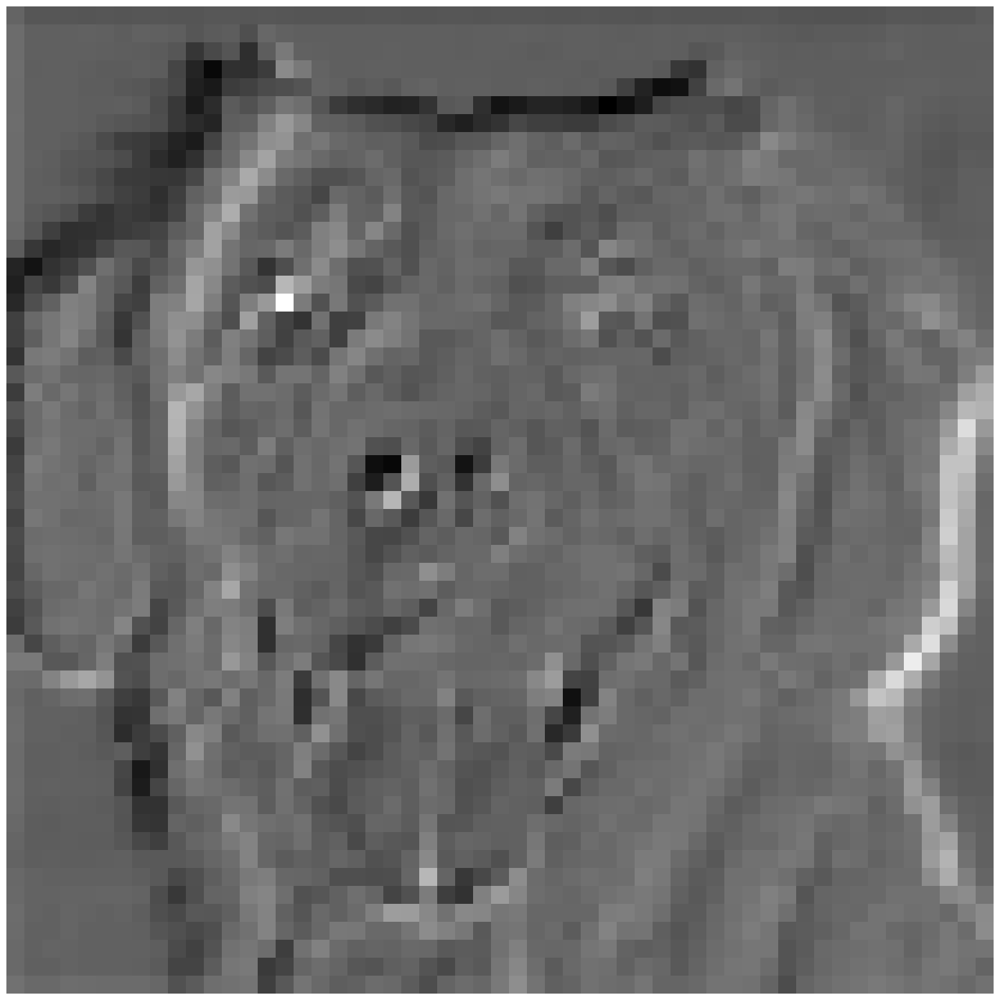

In [ ]:
plot(out[0,0,:,:]) #plotting the extracting features

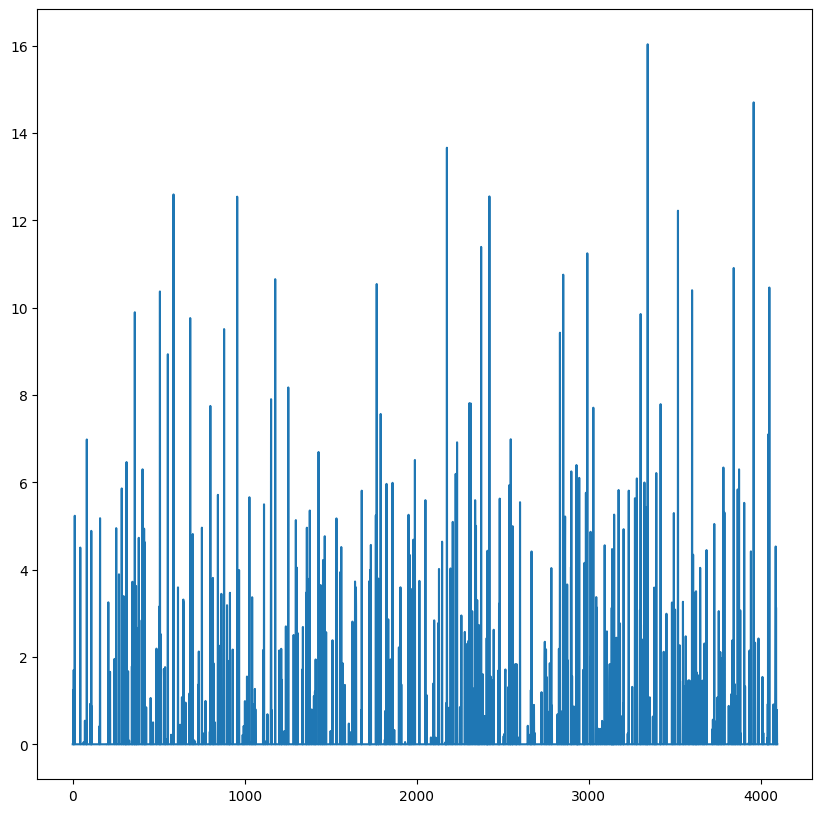

In [ ]:
#plotting a graph of the output of the neural network classifier
plt.plot(np.arange(4096),net.classifier[0:6](net.avgpool(net.features[0:13](img_variable)).flatten()).cpu().detach().numpy())
fig = plt.gcf()
fig.set_size_inches(10, 10) #setting size of the plot

In [ ]:
im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')
#loading an image from a url

<ipython-input-27-db4016f420a5>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')


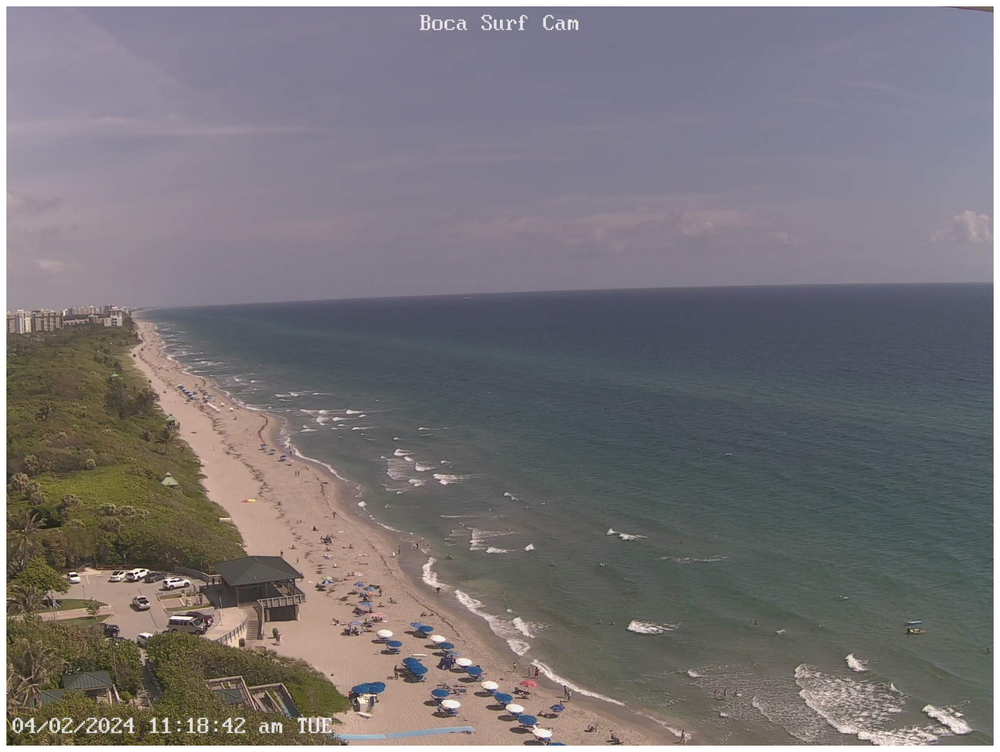

In [ ]:
plot(im) #plotting the image from the url

In [ ]:
def load_im(im): #function to load an image, preprocess it, and convert it into a tensor
    image = Image.fromarray(im) #convert to pil
    img_tensor = preprocess(image)
    img_tensor = img_tensor.unsqueeze_(0)
    img_variable = torch.tensor(img_tensor).cuda(0)
    return img_variable

In [ ]:
out = net(load_im(im)) #forward pass of the neural network on the loaded image

<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


function to perform inference on an image

In [ ]:
def inference(im):
    out = net(load_im(im))
    label_index = out.cpu().data.numpy().argmax()
    top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])
    print(labels[label_index])
    print('____')
    for i in range(10):
        print(labels[top_list[i]])

In [ ]:
inference(im) #performing inference

seashore, coast, seacoast, sea-coast
____
seashore, coast, seacoast, sea-coast
promontory, headland, head, foreland
sandbar, sand bar
breakwater, groin, groyne, mole, bulwark, seawall, jetty
cliff, drop, drop-off
valley, vale
lakeside, lakeshore
alp
volcano
dalmatian, coach dog, carriage dog


<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


# Restart Notebook (Disconnect and Delete Runtime) Before Running Next Section

# Custom Data Deck

In [ ]:
#The '%%capture' magic command suppresses the output of pip installations.

In [ ]:
%%capture
#Installing the required packages
!pip install wandb  # Install the Weights & Biases library
!apt-get install poppler-utils  # Install Poppler utilities for working with PDFs
!pip install pdf2image  # Install pdf2image for converting PDFs to images
!pip install flashtorch  # Install flashtorch for visualizing CNN layers
#Importing necessary libraries
import requests #for making HTTP requests
from pdf2image import convert_from_path #for converting images to PDFs
import matplotlib.pyplot as plt #for plotting images and graphs
import numpy as np #for numerical operations
import torch #for building and training neural networks
import requests #for making HTTP requests
from torchvision import * #for computer vision tasks
from torchvision.models import * #pre-trained models
from flashtorch.utils import apply_transforms #for applying transformations to images
import wandb as wb #for tracking and visualizing experiments with weights and biases

In [ ]:
#Define a function to create a GPU tensor with requires_grad set to True
def GPU(data):
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))
#Define a function to create a GPU tensor with requires_grad set to false
def GPU_data(data):
    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=torch.device('cuda'))

Define a function to plot images

In [ ]:
def plot(x):
    fig, ax = plt.subplots() #create a matplotlib figure and axis
    im = ax.imshow(x, cmap = 'gray') #dispaying the image with a grayscale colormap
    ax.axis('off') #turning off the axis
    fig.set_size_inches(5, 5) #setting the figure size
    plt.show()

In [ ]:
#define a function to get a URL of a google slides presentation
def get_google_slide(url):
    url_head = "https://docs.google.com/presentation/d/" #Extract the unique identifier of the Google Slide presentation from the input URL
    url_body = url.split('/')[5] #Extract the unique identifier of the Google Slide presentation from the input URL
    page_id = url.split('.')[-1] #extract the page ID from the input URL
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id #return the constructed downloaded URL

#define a function to get a slides from a google slides presentation
def get_slides(url):
    url = get_google_slide(url) #get the downloaded URL for the google slides presentation
    r = requests.get(url, allow_redirects=True) #Fetch the PDF file from the downloaded URL
    open('file.pdf', 'wb').write(r.content) #save the PDF file locally as "file.pdf"
    images = convert_from_path('file.pdf', 500) #convert the PDF slides into a list of images with a resolution of 500 DPI
    return images #return the list of images representing each slide in the presentation

#define a function to load and apply transformations to an image
def load(image):

    return apply_transforms(image).clone().detach().requires_grad_(True).to(device)

#checking if the GPU is available and setting the device accordingly
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

fetching class labels from a URL and creating a dictionary

In [ ]:
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()}

In [ ]:
#loading the AlexNet model and setting it into evaluation
model = alexnet(weights='DEFAULT').to(device)
model.eval();

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:07<00:00, 33.6MB/s]


connects "url" to a google slides presentation link

In [ ]:
url = "https://docs.google.com/presentation/d/1lyE52a0yLCu9iUiKeFmdKayGJhu2Z6fyToXEMKeigoY/edit#slide=id.p"

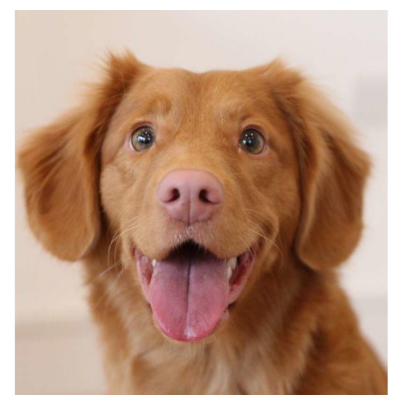

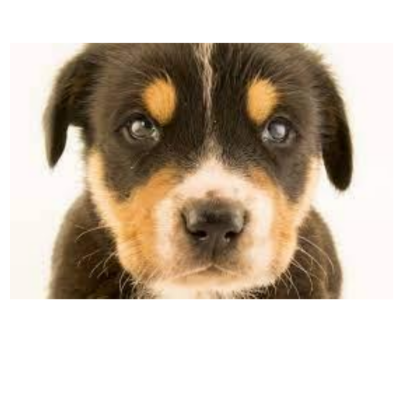

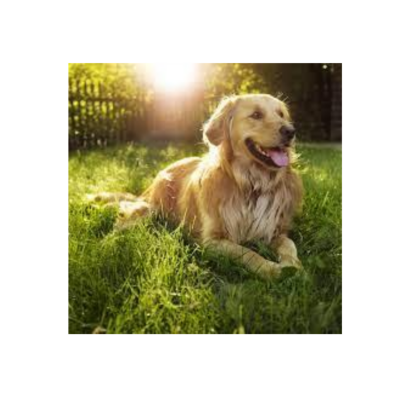

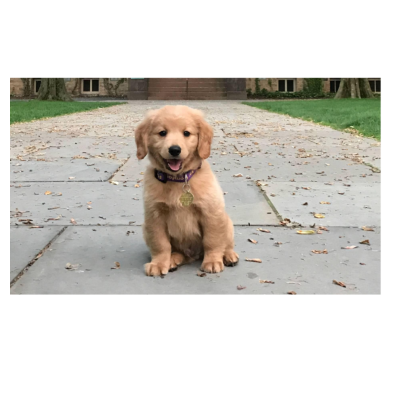

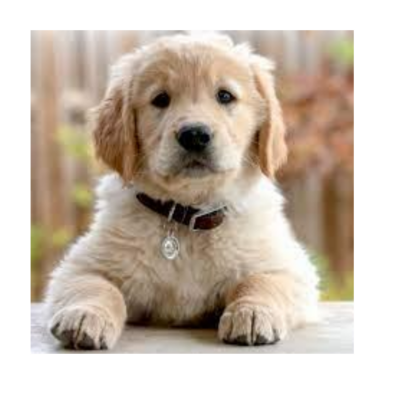

...

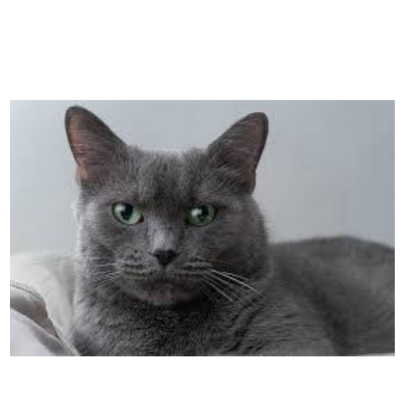

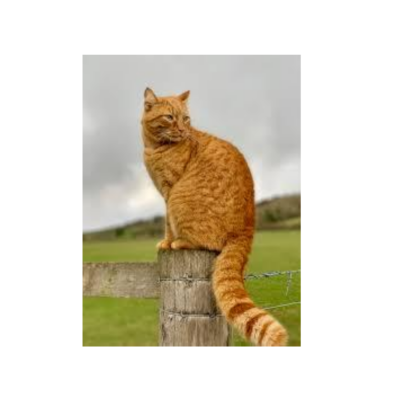

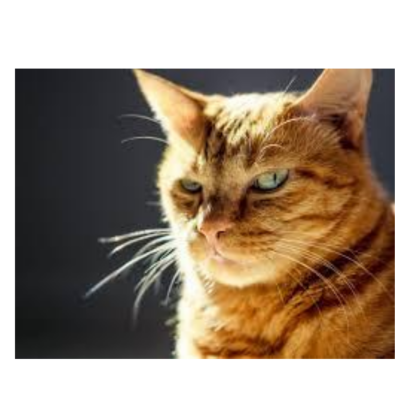

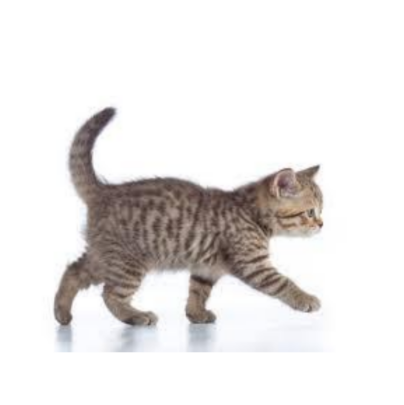

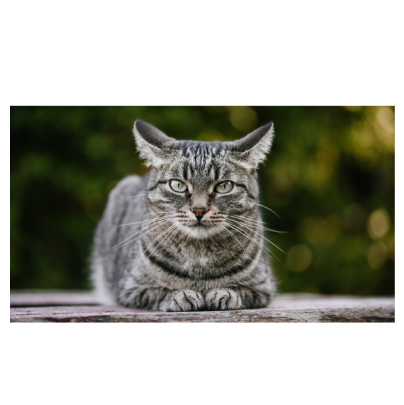

In [ ]:
images = [] #list to store images

for image in get_slides(url): #repeat through each image extracted from the slides obtained by calling the "get_slides" function with the given URL

    plot(image) #plot each image using the plot function

    images.append(load(image)) #Convert each plotted image into a PyTorch tensor and load it using the load function then append it to the image list

images = torch.vstack(images) #stack the list of image tensors vertically to create a single tensor containing all the images

In [ ]:
images.shape #get the shape of the tensor that has the images

torch.Size([50, 3, 224, 224])

In [ ]:
model(images) #pass the images through the model to obtain the predicted outputs

tensor([[-4.8363, -1.7068, -6.5516,  ..., -6.4279,  2.2313,  4.6001],
        [-2.4608, -1.9322, -1.9595,  ..., -3.3712,  4.3565,  1.3660],
        [ 0.4997, -2.8844, -4.2445,  ..., -0.8599,  1.1021, -1.5325],
        ...,
        [-4.7939, -0.9637, -3.2163,  ..., -2.8384,  3.9926,  7.5527],
        [ 4.8401,  0.8611, -2.1509,  ..., -2.5376,  2.2719, -0.1798],
        [-2.1406, -2.5765, -4.3910,  ..., -5.1000,  4.1630,  1.6769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

In [ ]:
y = model(images) #setting "y" to pass the images through the model to obtain the predicted outputs

In [ ]:
y.shape #retrieves the shape of the output tensor

torch.Size([50, 1000])

In [ ]:
guesses = torch.argmax(y, 1).cpu().numpy() #getting the predicted guesses

In [ ]:
for i in list(guesses):
    print(labels[i]) #printing the predicted labels

golden retriever
Appenzeller
cocker spaniel, English cocker spaniel, cocker
golden retriever
golden retriever
pug, pug-dog
Samoyed, Samoyede
golden retriever
German shepherd, German shepherd dog, German police dog, alsatian
malinois
Border collie
hare
Sealyham terrier, Sealyham
Staffordshire bullterrier, Staffordshire bull terrier
Border collie
Eskimo dog, husky
Saint Bernard, St Bernard
flat-coated retriever
golden retriever
Labrador retriever
golden retriever
Bernese mountain dog
Pembroke, Pembroke Welsh corgi
English foxhound
Appenzeller
Egyptian cat
Egyptian cat
Egyptian cat
tiger cat
tabby, tabby cat
Siamese cat, Siamese
tabby, tabby cat
tabby, tabby cat
Persian cat
Persian cat
Egyptian cat
Egyptian cat
tabby, tabby cat
Egyptian cat
tabby, tabby cat
Egyptian cat
carton
Madagascar cat, ring-tailed lemur, Lemur catta
grey fox, gray fox, Urocyon cinereoargenteus
Egyptian cat
Siamese cat, Siamese
fox squirrel, eastern fox squirrel, Sciurus niger
tiger cat
Egyptian cat
tabby, tabby cat

creating ground truth labels

In [ ]:
Y = np.zeros(50,) #create a numpy array of 0s with a length of 50
Y[25:] = 1 #set the values from index 25 to the end of the array to 1

In [ ]:
Y #displays "Y"

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [ ]:
X = y.detach().cpu().numpy() #converting model outputs into a NumPy array

In [ ]:
X.shape #retrieves the shape of the output tensor "X"

(50, 1000)

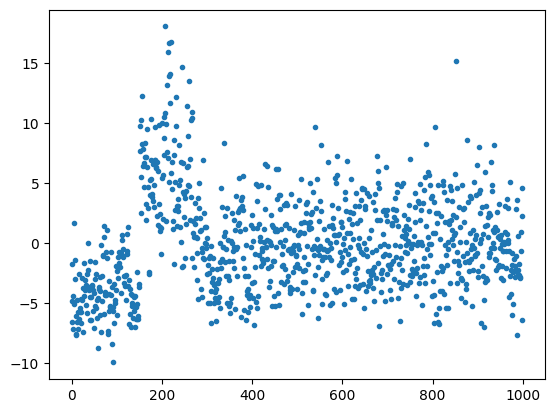

In [ ]:
plt.plot(X[0],'.') #plotting the first output

In [ ]:
X[0]

array([-4.83633614e+00, -1.70677257e+00, -6.55159044e+00, -7.10635042e+00,
       -4.43977499e+00,  1.66042566e+00, -5.05594349e+00, -2.98939395e+00,
       -1.42416644e+00, -7.62957430e+00, -7.59556818e+00, -6.08879948e+00,
       -6.55121279e+00, -4.74902964e+00, -5.73805332e+00, -7.11394691e+00,
       -2.56965208e+00, -6.34198475e+00, -5.37477684e+00, -5.75084305e+00,
       -6.63863087e+00, -5.72297239e+00, -4.61849451e+00, -4.76829338e+00,
       -2.89168382e+00, -3.71457100e+00, -7.42982292e+00, -1.67974627e+00,
       -4.43151283e+00, -3.93318748e+00, -3.05484676e+00, -3.46293879e+00,
       -3.66032219e+00, -5.18576813e+00, -2.54278874e+00, -5.77422571e+00,
        3.40391695e-02, -2.19287682e+00, -3.86693597e+00, -3.66045237e+00,
       -4.46033478e+00, -6.35605049e+00, -1.51816010e+00, -4.50653887e+00,
       -6.40877628e+00, -3.53934669e+00, -3.50566053e+00, -5.64465570e+00,
       -3.93838167e+00, -7.04626989e+00, -4.18983507e+00, -1.59430861e+00,
       -3.02305627e+00, -

In [ ]:
np.argmax(X[0]) #finding the index of the maximum value in the first output

207

In [ ]:
labels[948] #printing the label corresponding to the output

'Granny Smith'

In [ ]:
top_ten = np.argsort(X[0])[::-1][0:10] #getting the top ten indices with the highest values

In [ ]:
#Printing the labels corresponding to the top ten indices
for i in top_ten:
    print(labels[i])

golden retriever
Sussex spaniel
Brittany spaniel
Irish setter, red setter
tennis ball
Tibetan mastiff
cocker spaniel, English cocker spaniel, cocker
clumber, clumber spaniel
chow, chow chow
vizsla, Hungarian pointer


In [ ]:
labels

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

(array([ 10., 132., 240., 275., 188.,  96.,  30.,  19.,   6.,   4.]),
 array([-9.93127918, -7.13467312, -4.33806705, -1.54146123,  1.25514472,
         4.05175066,  6.84835672,  9.64496231, 12.44156837, 15.23817444,
        18.0347805 ]),
 <BarContainer object of 10 artists>)

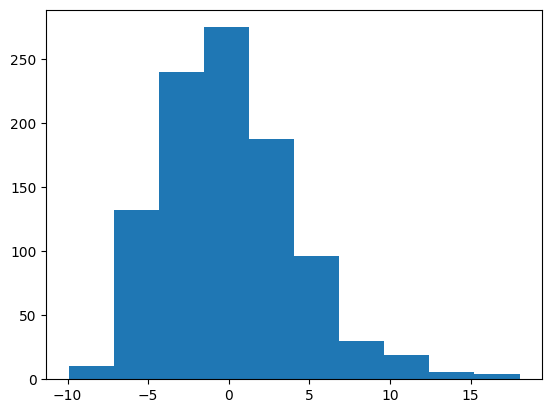

In [ ]:
plt.hist(X[0]) #plotting a histogram of the first output

Converting "X" and "Y" to GPU tensors

In [ ]:
X = GPU_data(X)
Y = GPU_data(Y)

In [ ]:
#define a softmax function
def softmax(x):
    #Calculate the numerator of the softmax function by subtracting the maximum value along the second dimension
    #This step helps prevent numerical instability by shifting the values to a range where exponentiation won't overflow

    s1 = torch.exp(x - torch.max(x,1)[0][:,None])

    # Calculate the denominator of the softmax function by summing the elements along the second dimension
    # This computes the normalization factor for each row of the numerator
    s = s1 / s1.sum(1)[:,None]

    return s

In [ ]:
#define a cross entropy loss function
def cross_entropy(outputs, labels):
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0]

Define a function to generate truncated normal random numbers

In [ ]:
def Truncated_Normal(size):

#generate two uniform random variables u1 and u2
    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2)
    u2 = torch.rand(size)

    #Apply the Box-Muller transform to generate standard normal random variables
    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2)

    return z

In [ ]:
#define a function to calculate accuracy
def acc(out,y):
    with torch.no_grad():
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0]

In [ ]:
X.shape #retrieves the shape of the output tensor "X"

torch.Size([50, 1000])

In [ ]:
#Define a function to get a batch of data
def get_batch(mode):
    b = c.b #get the batch size from the configuration
    if mode == "train": #If the mode is training data
        r = np.random.randint(X.shape[0]-b) #generate a random index within the range of the training data minus the batch size
        #extract the batch of input data and labels from the training set
        x = X[r:r+b,:]
        y = Y[r:r+b]

    elif mode == "test": #If the mode is testing data
        r = np.random.randint(X_test.shape[0]-b) #Generate a random index within the range of the test data minus the batch size
        #extract the batch of input data and labels from the testing data
        x = X_test[r:r+b,:]
        y = Y_test[r:r+b]
    return x,y #return the batch of input data and labels

define a simple linear model

In [ ]:
def model(x,w):

    return x@w[0]

In [ ]:
#define a function to make plots and log accuracy
def make_plots():

    acc_train = acc(model(x,w),y) #calculate the accuracy of the model on the training data

    wb.log({"acc_train": acc_train}) #log the training accuracy using weights and biases

In [ ]:
wb.init(project="Linear_Model_Photo_1"); #initalize weights and biases
c = wb.config #access configuration settings

#set hyperparameters
c.h = 0.001 #learning rate
c.b = 4 #batch size
c.epochs = 100000 #number of epochs

#initialize model weights
w = [GPU(Truncated_Normal((1000,2)))]

optimizer = torch.optim.Adam(w, lr=c.h) #define optimizer with Adam optimizer

#repeat over epochs
for i in range(c.epochs):

    x,y = get_batch('train') #get a batch of training data

    loss = cross_entropy(softmax(model(x,w)),y) #calculate the loss using cross-entropy loss

    #perform backpropagation and update model parameters
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    wb.log({"loss": loss}) #log the loss using weights and biases

    make_plots() #plot accuracy


<IPython.core.display.Javascript object>

Can't run the project, ran out of GPU space, the most I can do is add comments. Sorry